# **Large Language Models and Machine Learning for Unstructured Data**

*Coding session 3 (main part): Image Processing*

<br>

[Yabra Muvdi](https://yabramuvdi.github.io/) (ETH Zurich)

<br>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/unstructured-data/IESE-FRA-seminar-24/blob/main/notebooks/3a_coding_session.ipynb)



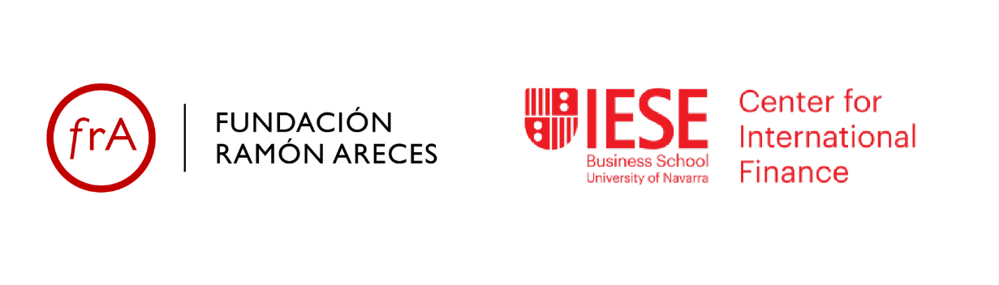

This notebook illustrates how to work with image data in Python. In the first part, we will see how to load images, pre-process them and use off-the-shelf finetuned models to get predictions.

<br>

In the second part we will train an image classification model on a particular classification task. Concretely, we will use the [ResNet model](https://huggingface.co/microsoft/resnet-50) to predict the type of land usage (e.g. crop, residential, river) from satellite images.

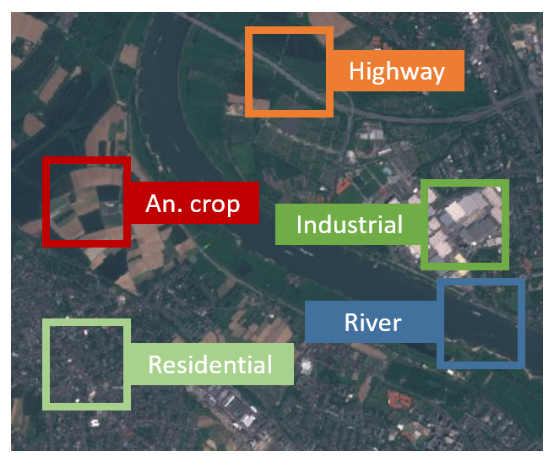

**Tutorials**

- [Image representation in Python](https://www.youtube.com/watch?v=kSqxn6zGE0c)
- [Image classification in HuggingFace](https://huggingface.co/docs/transformers/tasks/image_classification)
- [Visual Transformer finetunning](https://huggingface.co/blog/fine-tune-vit)

**Datset**

- [Paper](https://arxiv.org/pdf/1709.00029.pdf)
- [Sentinel 2 mission](https://sentinel.esa.int/documents/247904/1848117/Sentinel-2_Data_Products_and_Access)
- [Copernicus Data Ecosystem](https://dataspace.copernicus.eu/)

**Methods**

- [Bag of Visual Words](https://www.pinecone.io/learn/bag-of-visual-words/)

- [Visual Transformer](https://arxiv.org/pdf/2010.11929.pdf)

## 0. Setup

In [ ]:
# MAKE SURE TO BE CONNECTED TO A GPU RUNTIME!

In [1]:
%%capture
!pip3 install transformers datasets evaluate accelerate     # HugginFace libraries
!pip3 install openai                                        # OpenAI API
#!pip3 install google-generativeai                          # Google's Gemini API (no need to install when in Colab)

In [2]:
# basic libraries
import numpy as np
import urllib.request
import random
import torch
from IPython.core.display import HTML
from scipy.special import softmax
import pathlib
import requests

# LLMs APIs
import google.generativeai as genai
from openai import OpenAI

# plotting libraries
import matplotlib.pylab as plt

# image processing library
from PIL import ImageDraw, ImageFont, Image
from io import BytesIO

# HuggingFace relevant classes
from transformers import ViTImageProcessor, ViTForImageClassification, ResNetForImageClassification, AutoImageProcessor
from transformers import Trainer, TrainingArguments
from datasets import load_dataset, load_metric
import evaluate

## 1. Basics of image processing

We will start by briefly understanding how computers work with images. If you want to go further into the topic here are some resources:

- [Udacity tutorial](https://www.youtube.com/watch?v=EXZWHumclx0)
- [Pillow Library](https://pillow.readthedocs.io/en/stable/handbook/tutorial.html#using-the-image-class)

In [ ]:
# download image from URL
image_url = "https://www.spain.info/export/sites/segtur/.content/imagenes/cabeceras-grandes/madrid/palacio-cristal-parque-retiro-madrid-c-federico-gutierrez-u725920.jpg_604889389.jpg"
urllib.request.urlretrieve(image_url,
                           "el_retiro.jpg"         # path to save the image
                           )

('el_retiro.jpg', <http.client.HTTPMessage at 0x7a29abada2f0>)

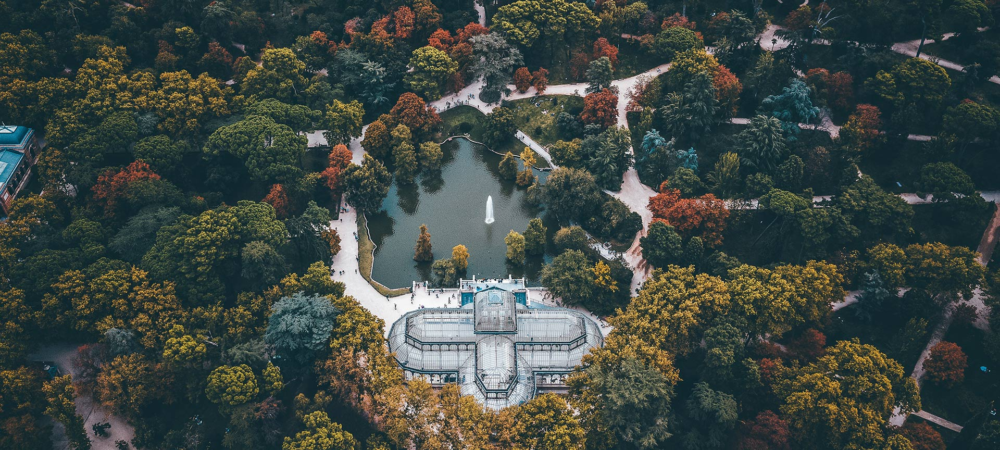

In [ ]:
# load a "local" image
image = Image.open("el_retiro.jpg")
image

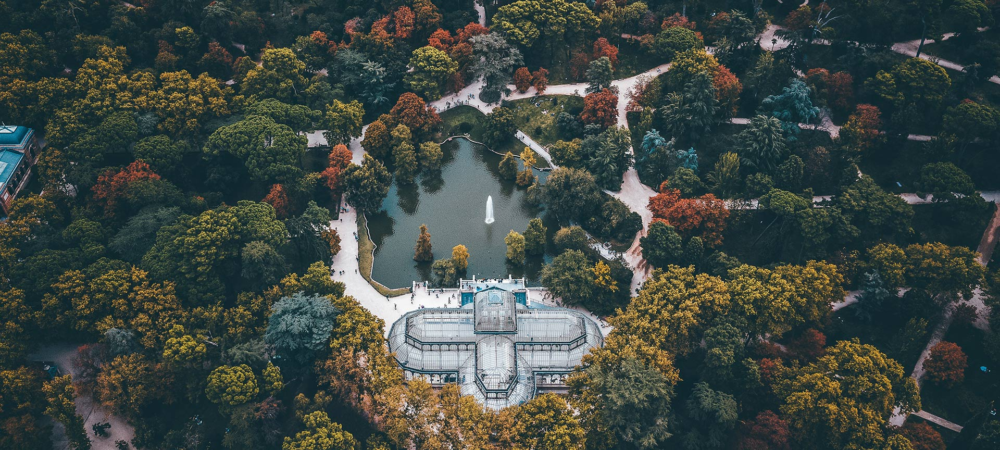

In [ ]:
# load image directly from URL (image is not downloaded)
image = Image.open(requests.get(image_url, stream=True).raw)
image

In [ ]:
# get multiple attributes from the image
image.format, image.size, image.mode

('JPEG', (1920, 864), 'RGB')

In [ ]:
# get the pixel values from the image
pixels = list(image.getdata())

# look at the RGB values from one pixel
pixels[1001]

(25, 44, 38)

In [ ]:
# how many pixels does our image have?
pixels = np.array(pixels)
pixels.shape

(1658880, 3)

In [ ]:
# how do we get to that number of pixels?

In [ ]:
# reshape the pixels
pixels_array = pixels.reshape((864, 1920, 3))
pixels_array.shape

(864, 1920, 3)

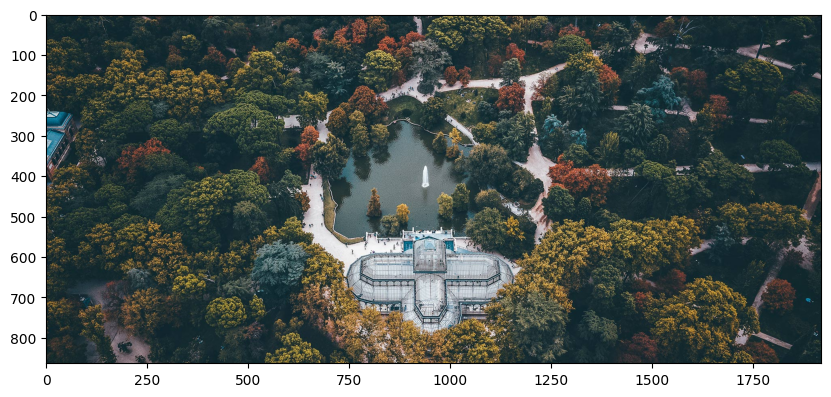

In [ ]:
# plot image in a 2D grid
fig, ax = plt.subplots(figsize=(10,6))
ax.imshow(pixels_array)
plt.show()

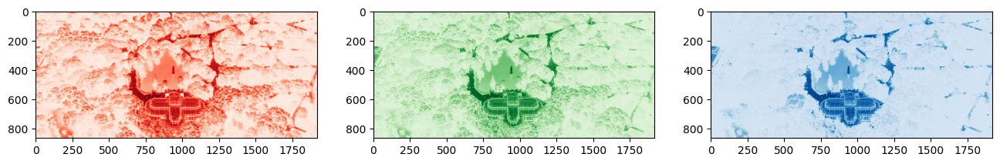

In [ ]:
# plot the pixels for each color separately
fig, axs = plt.subplots(1, 3, figsize=(16, 12))
axs[0].imshow(pixels_array[:,:,0], cmap="Reds")
axs[1].imshow(pixels_array[:,:,1], cmap="Greens")
axs[2].imshow(pixels_array[:,:,2], cmap="Blues")
plt.show()

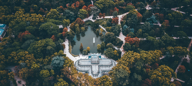

In [ ]:
# you can do many things with this library!
small_image = image.resize(( int(1920/10), int(864/10) ) )
small_image

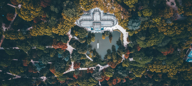

In [ ]:
small_image.rotate(180) # degrees counter-clockwise

## 2. Loading an image processor

We will now follow a similar pipeline to the LLM finetuning. We start by finding a model for our task in the HuggingFace [Model Hub](https://huggingface.co/models). We will use Microsoft's ```resnet-50``` model.

<br>

In the same spirit as tokenization in the context of text data, images need to be "tokenized" before we use them. Instead of the ```AutoTokenizer()``` we will use the ```AutoImageProcessor()``` class.


In [ ]:
model_name = 'microsoft/resnet-50'
feature_extractor = AutoImageProcessor.from_pretrained(model_name)
feature_extractor

preprocessor_config.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

ConvNextImageProcessor {
  "_valid_processor_keys": [
    "images",
    "do_resize",
    "size",
    "crop_pct",
    "resample",
    "do_rescale",
    "rescale_factor",
    "do_normalize",
    "image_mean",
    "image_std",
    "return_tensors",
    "data_format",
    "input_data_format"
  ],
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# extract features from a given image
image_features = feature_extractor(image, return_tensors='pt')
image_features

{'pixel_values': tensor([[[[-1.6555, -1.6213, -1.5870,  ..., -1.3473, -1.2274, -1.5870],
          [-1.6384, -1.6727, -1.5699,  ..., -1.0048, -1.5014, -1.5357],
          [-1.7412, -1.7240, -1.6555,  ..., -0.8335, -0.3027, -0.3027],
          ...,
          [-0.8507, -0.0458, -0.7137,  ..., -1.7412, -1.7240, -1.5699],
          [-0.6794, -0.1143, -1.1589,  ..., -1.7925, -1.7412, -1.6042],
          [-0.7479, -0.7137, -1.2959,  ..., -1.7925, -1.7925, -1.7754]],

         [[-1.1954, -1.1779, -1.1078,  ..., -1.1604, -1.0028, -1.2654],
          [-1.1779, -1.2129, -1.0903,  ..., -0.6527, -1.1429, -1.1429],
          [-1.2829, -1.2479, -1.1779,  ..., -0.6352, -0.3550, -0.7402],
          ...,
          [-0.7927, -0.2150, -0.6176,  ..., -1.3004, -1.2829, -1.1253],
          [-0.5476, -0.0924, -0.9678,  ..., -1.3529, -1.3004, -1.1604],
          [-0.5651, -0.6001, -1.0903,  ..., -1.3529, -1.3529, -1.3354]],

         [[-0.8807, -0.8458, -0.8110,  ..., -0.8807, -0.8110, -0.9853],
          [-0

In [ ]:
# dimensions of tensor: num_images, num_colors, num_pixels, num_pixels
image_features["pixel_values"].shape

torch.Size([1, 3, 224, 224])

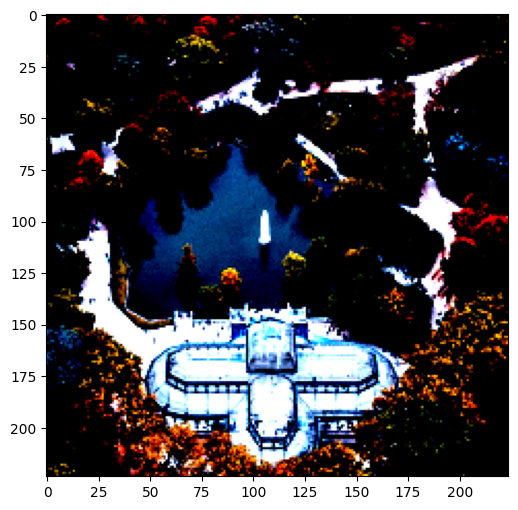

In [ ]:
# what happened to our image?
fig, ax = plt.subplots(figsize=(10,6))
ax.imshow(image_features["pixel_values"][0].permute(1, 2, 0))
plt.show()

## 3. Loading and using a pre-trained model

Now we need a model to make predictions using our image features.

In [ ]:
# load pre-trained model
model_name = 'microsoft/resnet-50'
model = ResNetForImageClassification.from_pretrained(model_name)

config.json:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

In [ ]:
# how many classes does the model have?
model.num_labels

1000

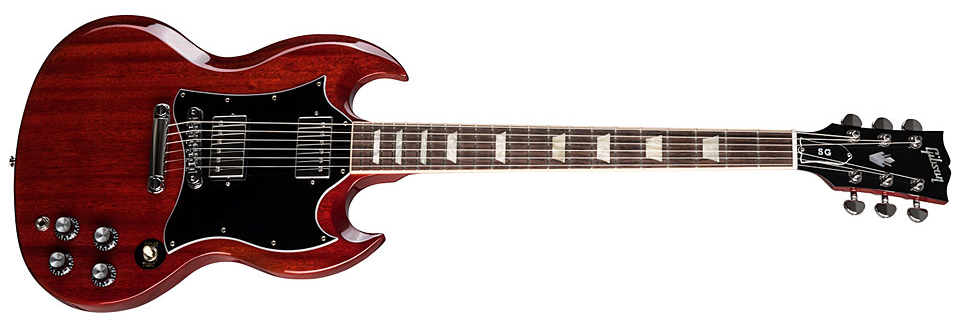

In [ ]:
# load image
image_url = "https://musicopolix.com/118093/sgs00hcch1.jpg"
image = Image.open(requests.get(image_url, stream=True).raw)
image

In [ ]:
# pass the image through the feature extractor
inputs = feature_extractor(image, return_tensors="pt")

# pass the extracted features through the pre-trained model
with torch.no_grad():
    result = model(**inputs)

In [ ]:
# what is result?
type(result)

transformers.modeling_outputs.ImageClassifierOutputWithNoAttention

In [ ]:
# extract the logits (preditions from the model). Why do we have 1,000 values?
logits = result.logits
logits.shape

torch.Size([1, 1000])

In [ ]:
# transform them into probabilities
probabilities = softmax(logits, axis=1)[0]
probabilities.sort()

In [ ]:
# get top labels
top_labels = logits.argsort()[0][-10:]
top_probs = probabilities[-10:]
for i, (l, p) in enumerate(zip(reversed(top_labels),reversed(top_probs)), 1):
    print(f"{i}. {model.config.id2label[l.item()]} ({np.round(p, 5)})")

1. electric guitar (0.9999799728393555)
2. rhinoceros beetle (0.0)
3. hatchet (0.0)
4. scorpion (0.0)
5. cornet, horn, trumpet, trump (0.0)
6. pick, plectrum, plectron (0.0)
7. violin, fiddle (0.0)
8. cello, violoncello (0.0)
9. sax, saxophone (0.0)
10. stage (0.0)


## 4. Image classification with a multimodal LLM

Some of the newest LLM are multimodal; they can take in input in the form of images or even audio. We will take advantage of this and demonstrate how to provide images to Gemini and GPT.

### Gemini

In [ ]:
# load the key
file_id = "1JY3m4w8jrscZCmWNljVJOpBZ9nRltN-7"
data = urllib.request.urlopen(f"https://drive.google.com/uc?export=download&id={file_id}&authuser=0&export=download")
api_key = data.read().decode("utf-8")

In [ ]:
# add your key to the API configuration
genai.configure(api_key=api_key)

In [ ]:
# initialize the model (make sure you choose one that has vision capabilities)
model = genai.GenerativeModel('gemini-1.5-flash')

In [ ]:
#### define the image information

# # local image
# input_image = {
#     'mime_type': 'image/jpg',
#     'data': pathlib.Path('el_retiro.jpg').read_bytes()
#     }

# image from url
input_image = {
    'mime_type': 'image/jpg',
    'data': BytesIO(requests.get(image_url).content).read()
    }

In [ ]:
# define the prompt
prompt = "What’s in this image?"

# use the model
response = model.generate_content(
    contents=[prompt, input_image]
    )

In [ ]:
# explore the response
print(response.text)

The image contains a red Gibson SG electric guitar.


### GPT-4o

In [3]:
# load the key
file_id = "1A1q8OK4oLhCL97tFQy5zitijdwwn5Sdl"
data = urllib.request.urlopen(f"https://drive.google.com/uc?export=download&id={file_id}&authuser=0&export=download")
api_key = data.read().decode("utf-8")

# initialize the client
client = OpenAI(api_key=api_key)


In [ ]:
# use the model
response = client.chat.completions.create(
  model="gpt-4o",  # make sure you choose one that has vision capabilities
  messages=[
    {
      "role": "user",
      "content": [
        {"type": "text", "text": "What’s in this image?"},
        {
          "type": "image_url",
          "image_url": {
            "url": "https://musicopolix.com/118093/sgs00hcch1.jpg",
          },
        },
      ],
    }
  ],
  max_tokens=50,
)

In [ ]:
# look at the response
print(response.choices[0].message.content)

This image shows a Gibson SG-style electric guitar. The guitar has a distinct double-cutaway design, a cherry-red finish, and features two humbucker pickups with a black pickguard. It also has a set of control knobs and a Tune-o


In [16]:
# # get some receipts
# receipts = ["https://www.dropbox.com/scl/fi/f58f55yx2ow42kwqs1bhr/20240531_212730.jpg?rlkey=fv42so30sllnpb7wrne8pi675&dl=1",
#             "https://www.dropbox.com/scl/fi/gk4o8xh3vvezr8yza3u6t/20240530_110611.jpg?rlkey=dh5n8vg007r3tqxmv9nnn2pbo&dl=1",
#             "https://www.dropbox.com/scl/fi/5pzoi05sm0tqi41uei02k/20240531_133324.jpg?rlkey=w8altau2ii2lwbisawbg179t3&dl=1"
#             ]

# use the model
response = client.chat.completions.create(
  model="gpt-4o",  # make sure you choose one that has vision capabilities
  messages=[
    {
      "role": "user",
      "content": [
        {"type": "text", "text": "Convert Invoice data into json format with appropriate json tags as required for the data in image"},
        {
          "type": "image_url",
          "image_url": {
            "url": "https://www.dropbox.com/scl/fi/f58f55yx2ow42kwqs1bhr/20240531_212730.jpg?rlkey=fv42so30sllnpb7wrne8pi675&dl=1",
          },
        },
      ],
    }
  ],
  max_tokens=400,
)

In [ ]:
# look at the response
print(response.choices[0].message.content)

Here is the JSON representation of the invoice data:

```json
{
  "store": "haicafe-london",
  "restaurant": "Hai Cafe",
  "orderDetails": {
    "order": "Table 4",
    "employee": "Cafe Manager",
    "pos": "POS 3"
  },
  "dineIn": [
    {
      "item": "CURRY Chicken (Dine In)",
      "quantity": 3,
      "price": 13.00,
      "total": 39.00
    },
    {
      "item": "SPRING ROLL Vegan (Dine In)",
      "quantity": 1,
      "price": 10.00,
      "total": 10.00
    },
    {
      "item": "TEA Hot (Ginger + Lemongrass)",
      "quantity": 2,
      "price": 3.00,
      "total": 6.00
    },
    {
      "item": "TEA Hot (Hibiscus)",
      "quantity": 1,
      "price": 3.00,
      "total": 3.00
    }
  ],
  "service": {
    "quantity": 1,
    "price": 5.80,
    "total": 5.80
  },
  "amountDue": {
    "subtotal": 63.80,
    "vat": {
      "rate": "20%",
      "amount": 10.63
    },
    "total": 63.80
  },
  "date": "31/05/2024",
  "time": "21:24"
}
```

Explanation of the JSON structure:



## 5. Load satellite image data

Now, let's go back to our example of satellite image data. We will use images collected and labeled by [Helber et al., 2019](https://arxiv.org/pdf/1709.00029.pdf). The data (i.e. EuroSAT) is made publicly available through HuggingFace [here](https://huggingface.co/datasets/jonathan-roberts1/EuroSAT). EuroSAT has a total of 27,000 labeled images with 10 different categories of land usage. Original images come from satellites from the [Sentinel-2 mission](https://sentinel.esa.int/web/sentinel/missions/sentinel-2) and focus on Europe.

<br><br>

> Remember you can use HuggingFace's [Datasets Hub](https://huggingface.co/datasets) to explore a wide range of publicly available text and image datasets.

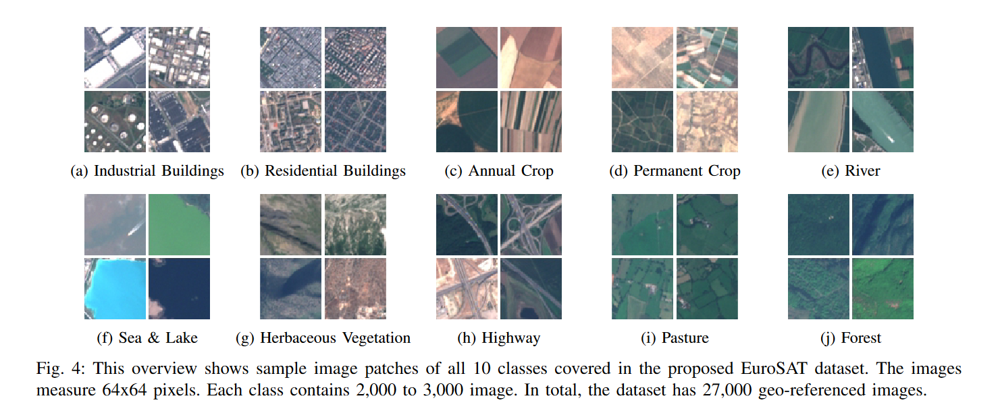

In [ ]:
# load land usage dataset directly from HugginFace using only the name of the data
dataset = load_dataset("jonathan-roberts1/EuroSAT")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/27000 [00:00<?, ? examples/s]

In [ ]:
# inspect the dataset object
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 27000
    })
})

Label of image:  0 



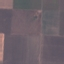

In [ ]:
# inspect one of the images and its label
print("Label of image: ", dataset["train"][0]["label"], "\n")
display(dataset["train"][0]["image"])

In [ ]:
# get a more detailed description of the labels
labels = dataset['train'].features['label']
for l in labels.names:
    print(f"- {l}")

- annual crop
- forest
- herbaceous vegetation
- highway
- industrial
- pasture
- permanent crop
- residential
- river
- sea or lake


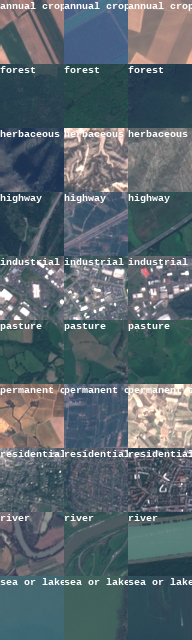

In [ ]:
# NO NEED TO RUN THIS CELL

# show examples from all the classes
def show_examples(dataset, seed=1234, examples_per_class=3, size=(64, 64)):

    w, h = size
    labels = dataset['train'].features['label'].names
    grid = Image.new('RGB', size=(examples_per_class * w, len(labels) * h))
    draw = ImageDraw.Draw(grid)
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf", 10)

    for label_id, label in enumerate(labels):

        # Filter the dataset by a single label, shuffle it, and grab a few samples
        ds_slice = dataset['train'].filter(lambda ex: ex['label'] == label_id).shuffle(seed).select(range(examples_per_class))

        # Plot this label's examples along a row
        for i, example in enumerate(ds_slice):
            image = example['image']
            idx = examples_per_class * label_id + i
            box = (idx % examples_per_class * w, idx // examples_per_class * h)
            grid.paste(image.resize(size), box=box)
            draw.text(box, label, (255, 255, 255), font=font)

    return grid

show_examples(dataset, seed=random.randint(0, 1337), examples_per_class=3)

## 6. Prepare data for finetuning

In [ ]:
# create a train/test split for finetuning
dataset = dataset["train"].train_test_split(test_size=0.2)
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 13824
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 3456
    })
})

In [ ]:
def process_example(example):
    inputs = feature_extractor(example['image'], return_tensors='pt')
    inputs['label'] = example['label']
    return inputs

In [ ]:
def transform(example_batch):

    # Take a list of PIL images and turn them to pixel values
    inputs = feature_extractor([x for x in example_batch['image']], return_tensors='pt')

    # Don't forget to include the labels!
    inputs['labels'] = example_batch['label']
    return inputs

In [ ]:
# apply image processing to the original images
prepared_ds = dataset.with_transform(transform)

In [ ]:
prepared_ds['train'][0:2]

{'pixel_values': tensor([[[[-0.5082, -0.4739, -0.4568,  ...,  0.1083,  0.0398, -0.0801],
          [-0.4739, -0.4397, -0.4226,  ...,  0.1597,  0.0741, -0.0458],
          [-0.4397, -0.4054, -0.3883,  ...,  0.1597,  0.0741, -0.0458],
          ...,
          [ 0.0227, -0.0629, -0.0972,  ...,  0.1426,  0.2453,  0.3138],
          [-0.0287, -0.1314, -0.1657,  ...,  0.0227,  0.1254,  0.2453],
          [-0.0801, -0.1828, -0.2342,  ..., -0.0801,  0.0227,  0.1939]],

         [[-0.5826, -0.5476, -0.5301,  ..., -0.1625, -0.1975, -0.2850],
          [-0.5476, -0.5301, -0.5126,  ..., -0.1450, -0.1800, -0.2675],
          [-0.5126, -0.4951, -0.4776,  ..., -0.1450, -0.1800, -0.2675],
          ...,
          [-0.2850, -0.3375, -0.3550,  ..., -0.0924, -0.0049,  0.0826],
          [-0.3375, -0.3901, -0.4076,  ..., -0.2150, -0.1099,  0.0126],
          [-0.3725, -0.4426, -0.4601,  ..., -0.3025, -0.1800, -0.0399]],

         [[-0.3404, -0.3230, -0.3055,  ..., -0.0092, -0.0441, -0.1138],
          [-0

## 7. Finetuning

In [ ]:
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['labels'] for x in batch])
    }

In [ ]:
metric = evaluate.load("accuracy")
def compute_metrics(p):
    return metric.compute(predictions=np.argmax(p.predictions, axis=1), references=p.label_ids)

In [ ]:
labels = dataset['train'].features['label'].names
labels

['annual crop',
 'forest',
 'herbaceous vegetation',
 'highway',
 'industrial',
 'pasture',
 'permanent crop',
 'residential',
 'river',
 'sea or lake']

In [ ]:
# re-load the pre-trained model with relevant parameters
model = ResNetForImageClassification.from_pretrained(
    model_name,
    num_labels=len(labels),
    id2label={str(i): c for i, c in enumerate(labels)},
    label2id={c: str(i) for i, c in enumerate(labels)},
    ignore_mismatched_sizes=True
)

Some weights of ResNetForImageClassification were not initialized from the model checkpoint at microsoft/resnet-50 and are newly initialized because the shapes did not match:
- classifier.1.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([10]) in the model instantiated
- classifier.1.weight: found shape torch.Size([1000, 2048]) in the checkpoint and torch.Size([10, 2048]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# define training arguments
training_args = TrainingArguments(
  output_dir="./",
  per_device_train_batch_size=16,
  eval_strategy="steps",
  num_train_epochs=4,
  fp16=True,
  save_steps=500,
  eval_steps=500,
  logging_steps=100,
  learning_rate=2e-4,
  save_total_limit=2,
  remove_unused_columns=False,
  push_to_hub=False,
  report_to='tensorboard',
  load_best_model_at_end=True,
  optim = "adamw_torch"
)

In [ ]:
# initialize trainer
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=prepared_ds["train"],
    eval_dataset=prepared_ds["test"],
    tokenizer=feature_extractor,
)

In [ ]:
# train! (should take around 15 minutes)
train_results = trainer.train()
trainer.save_model("./ft_model/")   # save finetuned model
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

Step,Training Loss,Validation Loss,Accuracy
500,0.552400,0.302170,0.923322
1000,0.292300,0.163185,0.952546
1500,0.265700,0.131595,0.961516
2000,0.130100,0.106323,0.967303
2500,0.163900,0.088834,0.970486
3000,0.150100,0.079923,0.978588


***** train metrics *****
  epoch                    =          4.0
  total_flos               = 1094351997GF
  train_loss               =        0.387
  train_runtime            =   0:09:43.58
  train_samples_per_second =       94.753
  train_steps_per_second   =        5.922


## 8. Use finetuned model

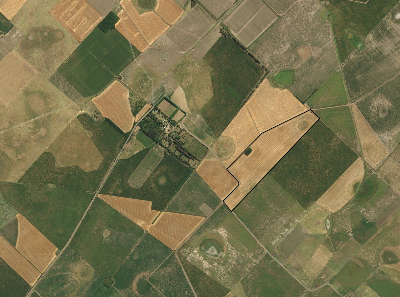

In [ ]:
# get an image from the web
url = 'https://i.stack.imgur.com/r2G2V.png'
image = Image.open(requests.get(url, stream=True).raw)
image

In [ ]:
# extracting features for the new image
inputs = feature_extractor(images=image, return_tensors="pt")
inputs

{'pixel_values': tensor([[[[ 1.4954,  1.3755,  1.0673,  ..., -0.2171, -0.1999, -0.6281],
          [ 1.2557,  1.0844,  1.2385,  ...,  0.2967, -0.2684, -0.6452],
          [ 0.8618,  1.4269,  0.8447,  ...,  0.5193,  0.2453, -0.1657],
          ...,
          [-0.0116, -0.1486,  0.0398,  ..., -0.1486, -0.0629,  0.0056],
          [-0.3541, -0.1486,  0.2796,  ..., -0.1657,  0.1083,  0.0912],
          [-0.0287, -0.3541,  0.2453,  ..., -0.0458,  0.2453,  0.1597]],

         [[ 0.9580,  0.7654,  0.5028,  ..., -0.0224, -0.0224, -0.2325],
          [ 0.6779,  0.5028,  0.7654,  ...,  0.3102, -0.1275, -0.1800],
          [ 0.2752,  0.8880,  0.3978,  ...,  0.3978,  0.1352,  0.0651],
          ...,
          [ 0.0826, -0.1275, -0.1099,  ..., -0.1450, -0.0399,  0.0126],
          [-0.2500, -0.0924,  0.2052,  ..., -0.1450, -0.0049, -0.0049],
          [-0.0049, -0.3025,  0.2227,  ..., -0.0224,  0.1702,  0.1877]],

         [[ 0.2871,  0.0779, -0.1661,  ..., -0.5670, -0.4973, -0.7761],
          [-0

In [ ]:
# load finetuned model (saved locally)
model_ft = ResNetForImageClassification.from_pretrained('./ft_model/')
outputs = model_ft(**inputs)
outputs

ImageClassifierOutputWithNoAttention(loss=None, logits=tensor([[-1.4390, -6.5341, -2.6127, -5.9629, -3.6656, -3.5672,  4.5773, -5.8919,
         -7.1086, -7.0504]], grad_fn=<AddmmBackward0>), hidden_states=None)

In [ ]:
logits = outputs.logits
probs = torch.nn.functional.softmax(logits, dim=1)
probs = probs.tolist()[0]

# get the position of the max logit
max_idx = np.argmax(probs)
max_label = labels[max_idx]
print(f"Predicted label: {max_label}")

Predicted label: permanent crop


In [ ]:
# list probabilities of all categories
for p, l in zip(probs, labels):
    print(f"{l} (with probability: {np.round(p,3)})")

annual crop (with probability: 0.002)
forest (with probability: 0.0)
herbaceous vegetation (with probability: 0.001)
highway (with probability: 0.0)
industrial (with probability: 0.0)
pasture (with probability: 0.0)
permanent crop (with probability: 0.996)
residential (with probability: 0.0)
river (with probability: 0.0)
sea or lake (with probability: 0.0)


In [ ]:
labels

['annual crop',
 'forest',
 'herbaceous vegetation',
 'highway',
 'industrial',
 'pasture',
 'permanent crop',
 'residential',
 'river',
 'sea or lake']

In [ ]:
# load the key
file_id = "1A1q8OK4oLhCL97tFQy5zitijdwwn5Sdl"
data = urllib.request.urlopen(f"https://drive.google.com/uc?export=download&id={file_id}&authuser=0&export=download")
api_key = data.read().decode("utf-8")

# initialize the client
client = OpenAI(api_key=api_key)

In [ ]:
# how does GPT perform?
response = client.chat.completions.create(
  model="gpt-4o",  # make sure you choose one that has vision capabilities
  messages=[
    {
      "role": "user",
      "content": [
        {"type": "text", "text": """ Classify the image into one of the following categories:
                                        'annual crop',
                                        'forest',
                                        'herbaceous vegetation',
                                        'highway',
                                        'industrial',
                                        'pasture',
                                        'permanent crop',
                                        'residential',
                                        'river',
                                        'sea or lake'
        """},
        {
          "type": "image_url",
          "image_url": {
            "url": "https://i.stack.imgur.com/r2G2V.png",
          },
        },
      ],
    }
  ],
  max_tokens=50,
)

In [ ]:
# look at the response
print(response.choices[0].message.content)

The image falls into the ‘annual crop’ category. The patchwork of fields with different shades suggests agricultural activity with areas being actively used for planting and harvesting crops.
